<a href="https://colab.research.google.com/github/cutlersimpson/GU-ML/blob/main/Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Part 1: Review
---

In [ ]:
#@markdown Imports

import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd 
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import Birch

In [ ]:
#@markdown Load data and perform preprocessing to remove group and id 

#load datasets
df = pd.read_table('https://raw.githubusercontent.com/PineBiotech/omicslogic/master/CellLines_ExprData_marked.txt',sep='\t',header=(0)) 

labels_list = df.loc[[0]] 

sample_names = df.loc[0] 
sample_names = list(df)[1:] 


labels = np.unique(labels_list) 
labels = np.delete(labels, np.where(labels == 'Group')) 

#Remove col "Group" at index 0 from data
data = df.drop([0]) 

#Remove id from axis
data = data.drop(['id'], axis=1) 
data = data.transpose() 


#Get list of all labels
flabels = labels_list.loc[0,:].values[1:] 

In [ ]:
#@markdown Cluster using Kmenas, hierarchical, and Birch clustering algorithms and setting the number of clusters equal to the number of unique labels in the dataset

clusters = len(labels)
print("Clusters: ", clusters)
kmeans_m = KMeans(n_clusters=clusters).fit(data)
hclust_m = AgglomerativeClustering(linkage='ward', n_clusters=clusters).fit(data)
birch_m = Birch(n_clusters=clusters).fit(data)

d = {'Samples':sample_names, 'Labels':flabels, 'Kmeans':kmeans_m.labels_, 'Hclust':hclust_m.labels_, 'Birch':birch_m.labels_}
df = pd.DataFrame(d)

print(df)

Clusters:  4
        Samples       Labels  Kmeans  Hclust  Birch
0        600MPE      Luminal       0       1      1
1         AU565      Luminal       1       2      2
2         BT474      Luminal       0       1      1
3         BT483      Luminal       0       1      1
4         BT549  Claudin-low       3       0      0
5         CAMA1      Luminal       0       1      1
6       EFM192A      Luminal       1       2      2
7       EFM192B      Luminal       1       2      2
8       EFM192C      Luminal       1       2      2
9       HCC1143        Basal       2       0      0
10      HCC1395  Claudin-low       2       0      0
11      HCC1419      Luminal       0       1      1
12      HCC1428      Luminal       0       1      1
13      HCC1569        Basal       2       0      0
14      HCC1806        Basal       2       0      0
15      HCC1937        Basal       2       0      0
16      HCC1954        Basal       2       0      0
17       HCC202      Luminal       0       3      3

In [ ]:
#@markdown Summarize the reults from each clustering algorithm by creating a confusion matrix which shows how accurately the method was at assigning samples to clusters

kmeans = pd.crosstab(df.Labels, df.Kmeans, margins=True)
hclust = pd.crosstab(df.Labels, df.Hclust, margins=True)
birch = pd.crosstab(df.Labels, df.Birch, margins=True)

print(kmeans)
print()
print(hclust)
print()
print(birch)

Kmeans        0  1   2  3  All
Labels                        
Basal         0  0  11  0   11
Claudin-low   0  0   2  2    4
Luminal      12  8   0  0   20
Normal-like   0  0   3  0    3
All          12  8  16  2   38

Hclust        0   1  2  3  All
Labels                        
Basal        11   0  0  0   11
Claudin-low   4   0  0  0    4
Luminal       0  11  8  1   20
Normal-like   3   0  0  0    3
All          18  11  8  1   38

Birch         0   1  2  3  All
Labels                        
Basal        11   0  0  0   11
Claudin-low   4   0  0  0    4
Luminal       0  11  8  1   20
Normal-like   3   0  0  0    3
All          18  11  8  1   38


Text(0.5, 1.0, 'Hierarchical Clustering Cluster Prediction')

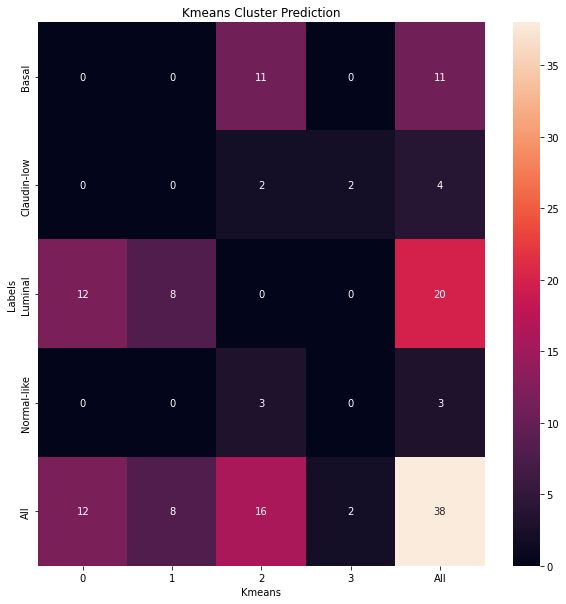

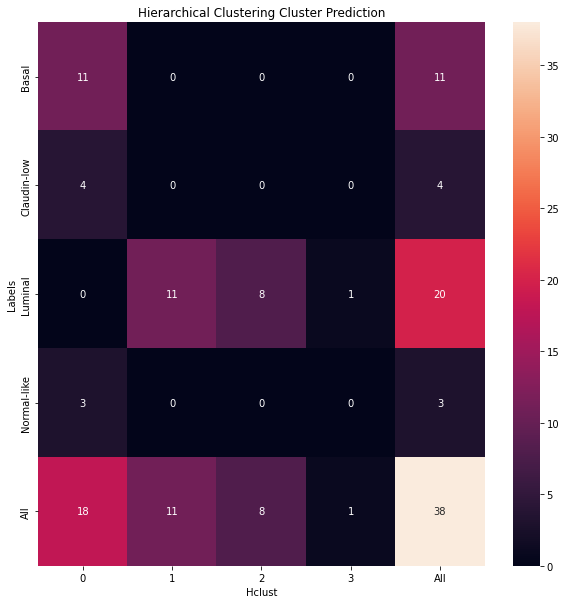

In [ ]:
#@markdown Heatmap showing breakdown of clusters for Kmeans and Hierarchical clustering algorithms

import seaborn as sns

plt.figure(figsize=(10, 10))
sns.heatmap(kmeans, annot=True)
plt.title("Kmeans Cluster Prediction", fontsize =12)

plt.figure(figsize=(10, 10))
sns.heatmap(hclust, annot=True)
plt.title("Hierarchical Clustering Cluster Prediction", fontsize =12)


289732.3705604166


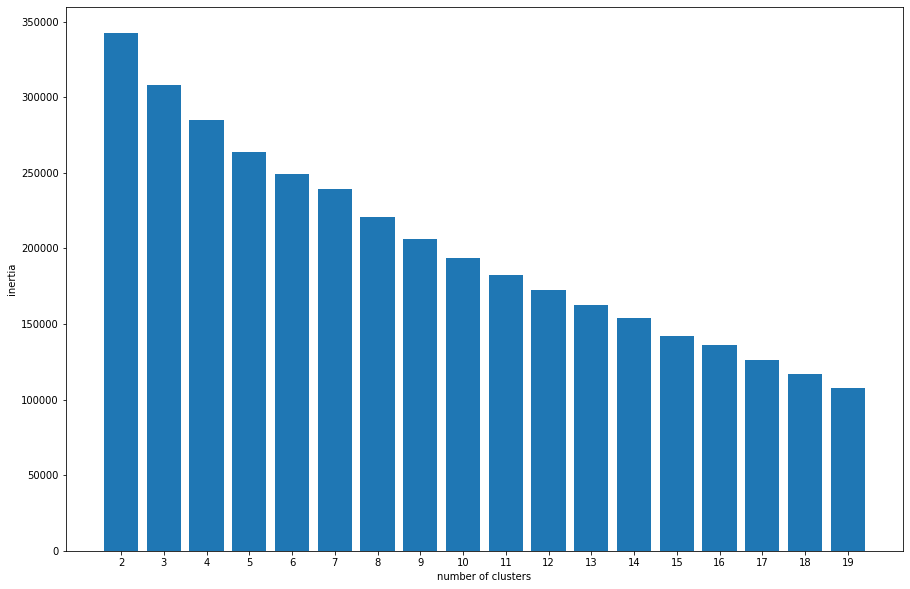

In [ ]:
#@markdown Evaluate the K-means inertia (the lower the intertia the better) and finding the elbow in the data around 3 clusters. The above data results from using the length of unique labels (4) for the number of clusters

#K-means evaluation inertia
print(kmeans_m.inertia_)

#check param
df1 = pd.DataFrame()

#create a dataframe with noise and number of components
for i in range (2,20):
  kmeans_m = KMeans(n_clusters=i).fit(data)
  df1 = df1.append({'clust':i,'inertia': kmeans_m.inertia_}, ignore_index=True)

plt.figure(figsize=(15, 10))
plt.bar(df1.clust, df1.inertia)
plt.xlabel('number of clusters')
plt.ylabel('inertia')
plt.xticks(np.arange(min(df1.clust), max(df1.clust)+1, 1.0));

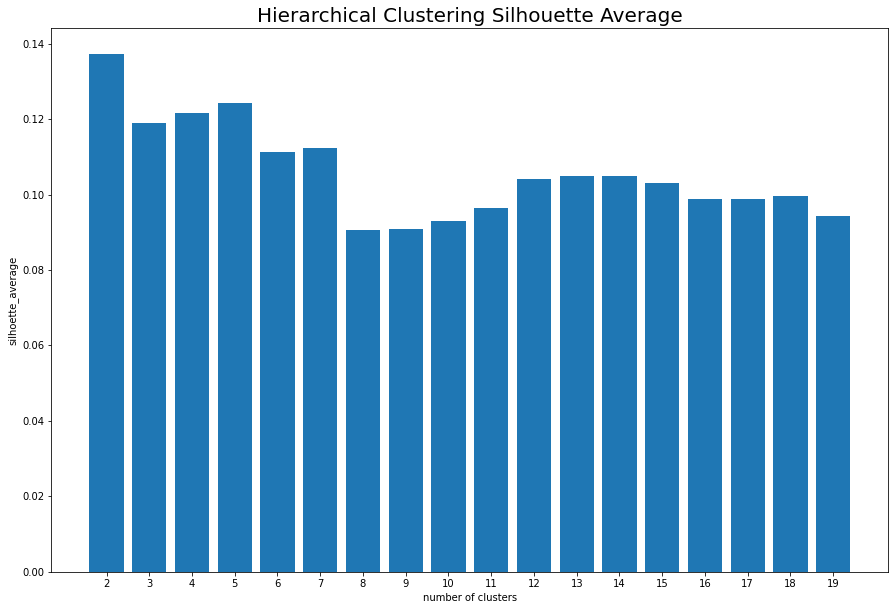

In [ ]:
#@markdown The silhouette score can be used to measure cohesion. That is, how similar a point in a cluster is to its own cluster compared to other clusters. The closer the value is to 1, the better the score. This plot shows that hierarchical clustering may be ideal with only 2 clusters compared to the 4 it was initially ran with.

from sklearn.metrics import silhouette_samples, silhouette_score

df_scores_hc = pd.DataFrame()

for i in range (2,20):
  hclust_m = AgglomerativeClustering(linkage='ward', n_clusters=i).fit(data)
  cluster_labels = hclust_m.fit_predict(data)
  silhouette_avg = silhouette_score(data, cluster_labels)
  #print("For %s clusters" %(i), "the average silhouette_score is:", silhouette_avg)
  df_scores_hc = df_scores_hc.append({'clust':i,'silhouette_avg': silhouette_avg}, ignore_index=True)

plt.figure(figsize=(15, 10))
plt.bar(df_scores_hc.clust, df_scores_hc.silhouette_avg)
plt.xlabel('number of clusters')
plt.ylabel('silhoette_average')
plt.title("Hierarchical Clustering Silhouette Average", fontsize=20)
plt.xticks(np.arange(2, 20, 1.0));

In [ ]:
#@markdown Updated confusion matrix values after changing the K-means clustering to use 3 clusters and hierarchical to use 2

kmeans_m = KMeans(n_clusters=3).fit(data)
hclust_m = AgglomerativeClustering(linkage='ward', n_clusters=3).fit(data)

d_update = {'Samples':sample_names, 'Labels':flabels, 'Kmeans':kmeans_m.labels_, 'Hclust':hclust_m.labels_}
df_update = pd.DataFrame(d_update)

kmeans_update = pd.crosstab(df_update.Labels, df_update.Kmeans, margins=True)
hclust_update = pd.crosstab(df_update.Labels, df_update.Hclust, margins=True)

print(kmeans_update)
print()
print(hclust_update)

Kmeans       0   1   2  All
Labels                     
Basal        0   0  11   11
Claudin-low  0   0   4    4
Luminal      8  12   0   20
Normal-like  0   0   3    3
All          8  12  18   38

Hclust        0   1  2  All
Labels                     
Basal         0  11  0   11
Claudin-low   0   4  0    4
Luminal      12   0  8   20
Normal-like   0   3  0    3
All          12  18  8   38


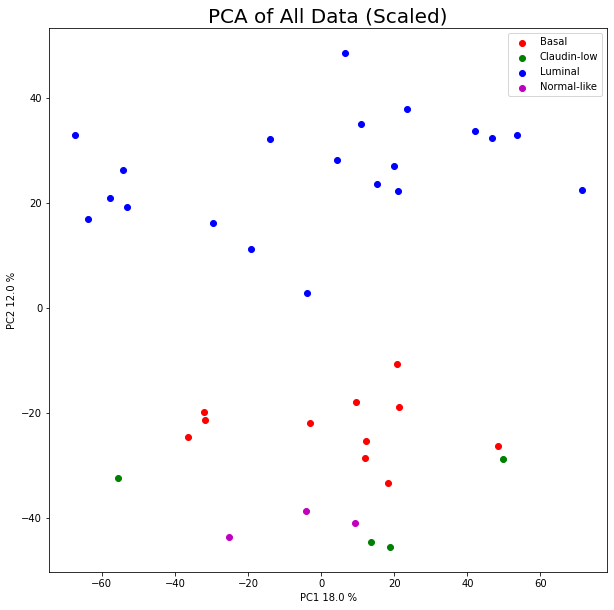

In [ ]:
#@markdown Use PCA to visualie the data in reduced demensionality space to see the clusters
#@markdown This plot shows there are two or three distinct clusters in the data.

from sklearn.preprocessing import StandardScaler 
scaled = StandardScaler() 
scaled.fit(data) 
scaled_data = scaled.transform(data) 

#Run Principal Component Analysis
from sklearn.decomposition import PCA 
pca = PCA(n_components=2) 
pca.fit(scaled_data) 
xpca = pca.transform(scaled_data)

#create dataframe for PCA
df_pca = pd.DataFrame(xpca)

PC1 = 0 
PC2 = 1 

plt.figure(figsize=(10, 10))

for i in range(0, xpca.shape[0]): 
  if flabels[i] == 'Basal': 
    c1 = plt.scatter(xpca[i,PC1],xpca[i,PC2], c='r') 
  elif flabels[i] == 'Claudin-low': 
    c2 = plt.scatter(xpca[i,PC1],xpca[i,PC2], c='g') 
  elif flabels[i] == 'Luminal': 
    c3 = plt.scatter(xpca[i,PC1],xpca[i,PC2], c='b') 
  elif flabels[i] == 'Normal-like': 
    c4 = plt.scatter(xpca[i,PC1],xpca[i,PC2], c='m') 

#Add labels to PCA scatterplot:
plt.legend([c1, c2, c3, c4],['Basal', 'Claudin-low', 'Luminal', 'Normal-like']) 
plt.xlabel(f'PC1 {round(pca.explained_variance_ratio_[0],2)*100} %') 
plt.ylabel(f'PC2 {round(pca.explained_variance_ratio_[1],2)*100} %') 
plt.title("PCA of All Data (Scaled)", fontsize=20)
plt.show() 

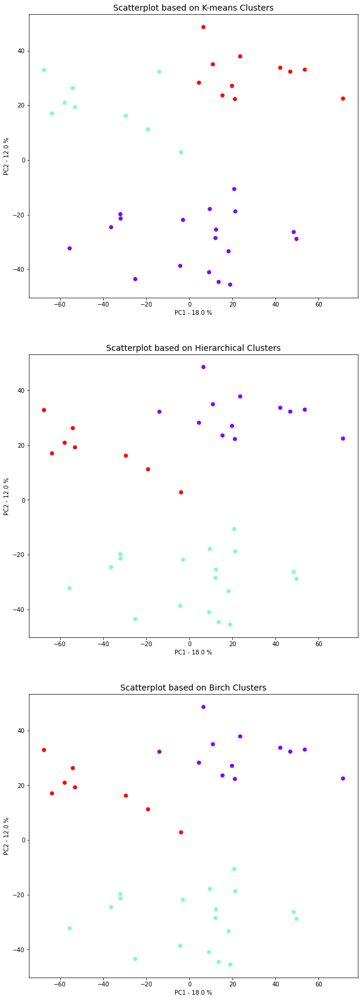

In [ ]:
#@markdown Display the scatterplots for K-means, hierarchical, and birch clustering using 3 clusters as shown in the PCA plot.

n_clust = 3

kmeans_m = KMeans(n_clusters=n_clust).fit(data)
hclust_m = AgglomerativeClustering(linkage='ward', n_clusters=n_clust).fit(data)
birch_m = Birch(n_clusters=n_clust).fit(data)

fig, ax = plt.subplots(3, figsize=(10, 30))

#Plot scatterplot for K-means Clustering
ax[0].scatter(df_pca[0], df_pca[1], c = kmeans_m.labels_, cmap ='rainbow')
ax[0].set_title("Scatterplot based on K-means Clusters", fontsize=14)
ax[0].set_xlabel(f'PC1 - {round(pca.explained_variance_ratio_[0],2)*100} %') 
ax[0].set_ylabel(f'PC2 - {round(pca.explained_variance_ratio_[1],2)*100} %') 

#Plot scatterplot for Hierarchical Clustering
ax[1].scatter(df_pca[0], df_pca[1], c = hclust_m.labels_, cmap ='rainbow')
ax[1].set_title("Scatterplot based on Hierarchical Clusters", fontsize=14)
ax[1].set_xlabel(f'PC1 - {round(pca.explained_variance_ratio_[0],2)*100} %') 
ax[1].set_ylabel(f'PC2 - {round(pca.explained_variance_ratio_[1],2)*100} %') 

#Plot scatterplot for Birch Clustering
ax[2].scatter(df_pca[0], df_pca[1], c = birch_m.labels_, cmap ='rainbow')
ax[2].set_title("Scatterplot based on Birch Clusters", fontsize=14)
ax[2].set_xlabel(f'PC1 - {round(pca.explained_variance_ratio_[0],2)*100} %') 
ax[2].set_ylabel(f'PC2 - {round(pca.explained_variance_ratio_[1],2)*100} %') 

plt.show()

# Reflection
---
<br>

To go about evaluating the cell line data, it was first read in as a Pandas table and preprocessed to acquire the sample names and labels then drop the unnecessary group and id values from the table. After this initial processing, K-means, hierarchical, and Birch clustering algorithms were all applied to the data. With these different clustering algorithms in place, a confusion matrix for each algorithm was created using the Pandas crosstab function to evaluate how accurately the method was at assigning samples to clusters. The results of these confusion matrices showed the hierarchical and Birch clustering results were identical while the K-means had different results, despite each method being passed the same argument for the number of clusters.

<br>

This difference was then explored further using a heatmap to display the clustering predictions for the K-means and hierarchical algorithms. To validate the accuracy of the K-means and hierarchical clusterings, the K-means intertia was plotted against a range of potential cluster values and the hierarchical silhouette score was plotted against a range of cluster values. The K-means intertia plot measures distance between clusters, therefore a low intertia score and a low number of clusters is ideal. Given this is a tradeoff, the optimal number of clusters can be found using the "Elbow method" in the intertia plot. In this case, the elbow, i.e. the point where the intertia begins to slow, is around 3 clusters. Given the initial K-means data used 4 clusters, the length of unique labels, the clustering could be improved with an updated value. In the hierarchical silhouette plot, the best case scenario results in a silhouette score of 1 because that implies a data point is more similar to the cluster it belongs to rather than the other clusters. This plot yields results showing 2 clusters is the optimal number using the hierarchical clustering algorithm, which again is not the value that was used when initially running the algorithm.

<br>

Following this evaluation of clusters, PCA was ran to visualize the data in reduced dimensionality to identify the natural clusters that arise in this view. The PCA plot of all data yielded two or three distinguishable groups, depending on how tightly the groups were to be defined. Using this information, the scatterplots for K-means, hierarchical, and birch clustering algorithms were plotted using 3 clusters as a parameter for the plot.

<br>

Despite the PCA plot only accounting for 30% of the variance, which is well below the accepted 80% threshold, it still helps to identify distinguishable clusters in the data. This information, when fed to each clustering algorithm, yields three unique clusters in the data, even though four labels (Basal, Luminal, Claudin low, Normal like) were provided in the original data. This implies there are similarities in the data to explore further.

# Part 2: Practice
---

To cluster genes, instead of samples, we need to keep the objects as rows instead of transposing the data. When loading data, do not transpose it but do make sure to eliminate non numeric data from the main matrix and keep the gene and sample labels in variables that later can be used.

# Load Data and set initial objects

In [ ]:
#Import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
from sklearn import metrics

#load data
df_load = pd.read_table('https://raw.githubusercontent.com/PineBiotech/omicslogic/master/CellLines_ExprData_marked.txt',sep='\t',header=(0)) 
labels_list = df_load.loc[[0]] 

#save sample names and clean them
#sample_names = df_load.loc[0] 
sample_names = list(df_load)[1:] 
labels = np.unique(labels_list) 
labels = np.delete(labels, np.where(labels == 'Group')) 

#save gene Ids and clean them
geneids = df_load['id']
geneids = geneids.drop([0]) 

#clean data
data=df_load.drop([0]) 

#will be used later on to add cluster IDs
df_clust = data
df_clust.set_index(['id'], inplace=True)

#data=data.drop(['id'], axis=1) 
datafinal = data.astype(float)

datafinal.shape

(6912, 38)

# PCA

PCA will help understand variance for the full dataset. After we perform PCA, we will see clusters in variance that explains well the fiull dataset.

In [ ]:
#first, we are going to explore the data (without transposing as before)
from sklearn.decomposition import PCA

pca_all = PCA().fit(datafinal)

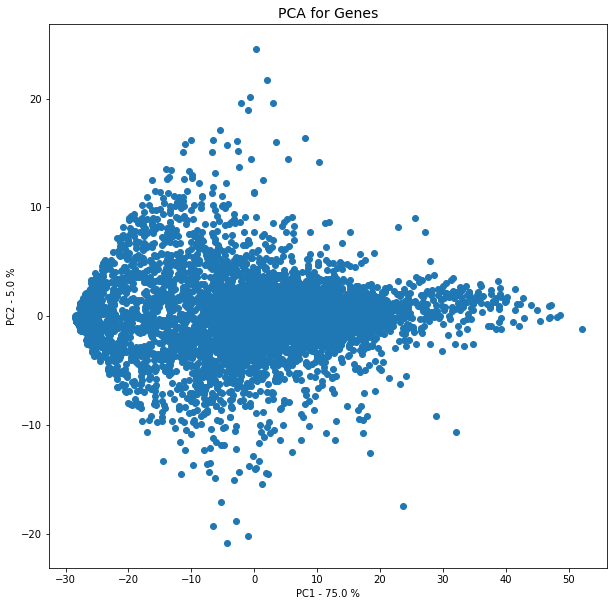

In [ ]:
#prepare a scatterplot of genes based on PC1 and PC2
X_pca = pca_all.transform(datafinal)

d = {'GeneIds':geneids, 'PC1':X_pca[:,0], 'PC2':X_pca[:,1]}
df = pd.DataFrame(d)

#make a scatterplot
plt.figure(figsize=(10, 10))

plt.scatter(df['PC1'], df['PC2'])
plt.title("PCA for Genes", fontsize=14)
plt.xlabel(f'PC1 - {round(pca_all.explained_variance_ratio_[0],2)*100} %') 
plt.ylabel(f'PC2 - {round(pca_all.explained_variance_ratio_[1],2)*100} %') 

plt.show() 

- n_components int, default=2
Dimension of the embedded space.

- perplexity, default=30.0
The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms. Larger datasets usually require a larger perplexity. Consider selecting a value between 5 and 50. Different values can result in significantly different results.

- early_exaggeration, default=12.0
Controls how tight natural clusters in the original space are in the embedded space and how much space will be between them. For larger values, the space between natural clusters will be larger in the embedded space. Again, the choice of this parameter is not very critical. If the cost function increases during initial optimization, the early exaggeration factor or the learning rate might be too high.

- learning_rate or ‘auto’, default=200.0
The learning rate for t-SNE is usually in the range [10.0, 1000.0]. If the learning rate is too high, the data may look like a ‘ball’ with any point approximately equidistant from its nearest neighbours. If the learning rate is too low, most points may look compressed in a dense cloud with few outliers. If the cost function gets stuck in a bad local minimum increasing the learning rate may help. Note that many other t-SNE implementations (bhtsne, FIt-SNE, openTSNE, etc.) use a definition of learning_rate that is 4 times smaller than ours. So our learning_rate=200 corresponds to learning_rate=800 in those other implementations. The ‘auto’ option sets the learning_rate to max(N / early_exaggeration / 4, 50) where N is the sample size, following [4] and [5]. This will become default in 1.2.

- n_iter, default=1000
Maximum number of iterations for the optimization. Should be at least 250.

- n_iter_without_progress, default=300
Maximum number of iterations without progress before we abort the optimization, used after 250 initial iterations with early exaggeration. Note that progress is only checked every 50 iterations so this value is rounded to the next multiple of 50.


In [ ]:
from sklearn.manifold import TSNE
tsne_em = TSNE(n_components=2, perplexity=40.0, early_exaggeration=10, n_iter=500, 
               n_iter_without_progress = 50, learning_rate=20, 
               verbose=0).fit_transform(X_pca)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


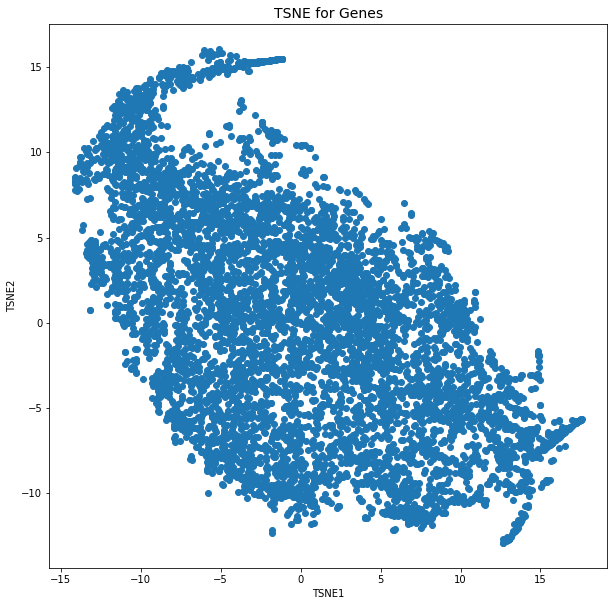

In [32]:
d = {'GeneIds':geneids, 'PC1':X_pca[:,0], 'PC2':X_pca[:,1], 'TSNE1':tsne_em[:,0], 'TSNE2':tsne_em[:,1]}
df = pd.DataFrame(d)

#make a scatterplot
plt.figure(figsize=(10, 10))

plt.scatter(df['TSNE1'], df['TSNE2'])
plt.title("TSNE for Genes", fontsize=14)
plt.xlabel('TSNE1') 
plt.ylabel('TSNE2') 

plt.show()

Number of DBSCAN clusters:  2


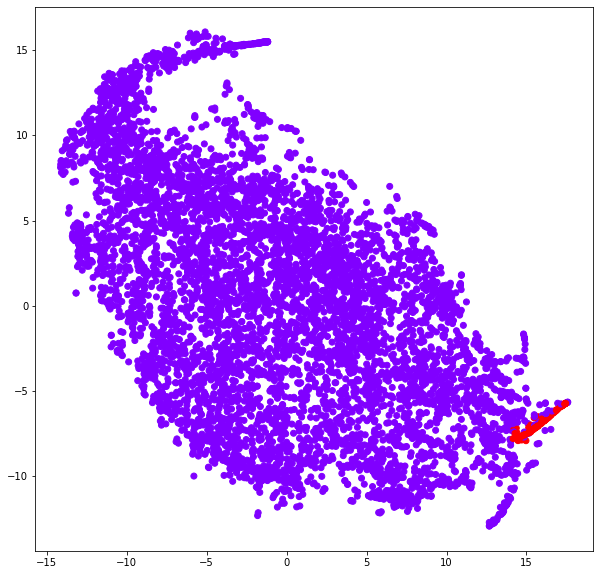

In [ ]:
from sklearn.cluster import DBSCAN

# DBSCAN eps=0.7, min_samples=30
dbscan = DBSCAN(eps=0.7, min_samples=30).fit(data) # Changing eps and min_samples can alter estimated number of clusters
print('Number of DBSCAN clusters: ', len(set(dbscan.labels_)))

#scatterplot
plt.figure(figsize=(10, 10))
plt.scatter(df['TSNE1'], df['TSNE2'], c = dbscan.labels_, cmap = 'rainbow')
plt.show()

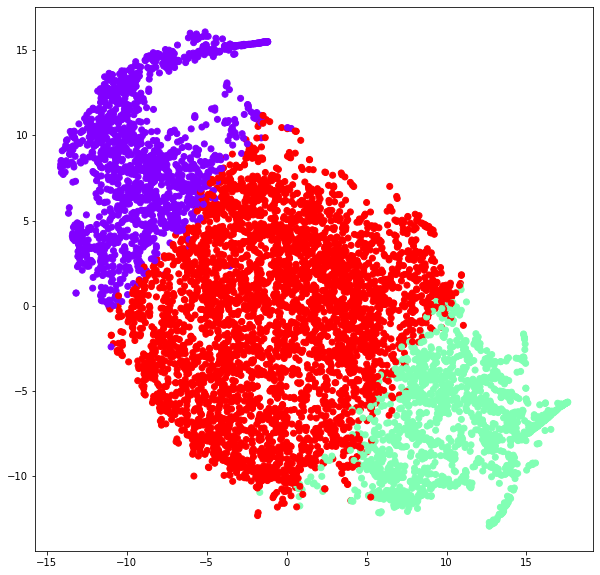

In [ ]:
#try the same with K-means

kmeans = KMeans(n_clusters=3).fit(data)

plt.figure(figsize=(10, 10))

plt.scatter(df['TSNE1'], df['TSNE2'], c = kmeans.labels_, cmap = 'rainbow')
plt.show()

In [ ]:
%%shell
pip install umap-learn --q
pip install umap-learn[plot] --q

     |████████████████████████████████| 88 kB 4.5 MB/s 
     |████████████████████████████████| 1.1 MB 21.4 MB/s 
     |████████████████████████████████| 18.2 MB 697 kB/s 
     |████████████████████████████████| 76 kB 4.9 MB/s 


In [ ]:
import os, umap

mapper = pd.DataFrame(umap.UMAP(n_neighbors=5, min_dist=0.1).fit_transform(datafinal), columns = ['UMAP1','UMAP2'])

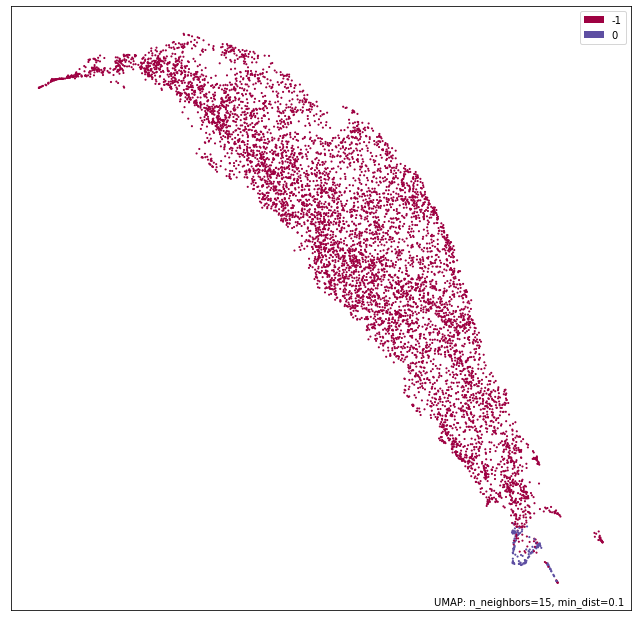

In [ ]:
#How to use UMAP plotting feature:
#make sure you install umap.plot by : pip install umap-learn[plot]

import umap.plot

umap_mapper = umap.UMAP().fit(data)
umap.plot.points(umap_mapper, labels=dbscan.labels_)

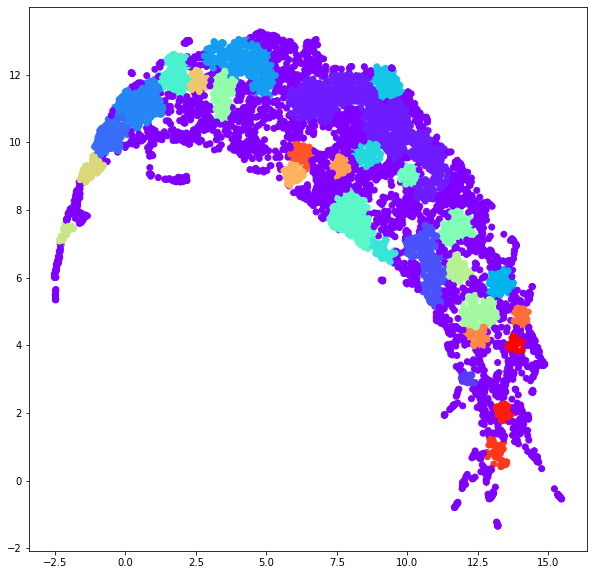

In [ ]:
dbscan_m = DBSCAN(eps=0.3, min_samples=40).fit(mapper)

#scatter plot
plt.figure(figsize=(10, 10))

plt.scatter(mapper['UMAP1'], mapper['UMAP2'], c = dbscan_m.labels_, cmap = 'rainbow')
plt.show()

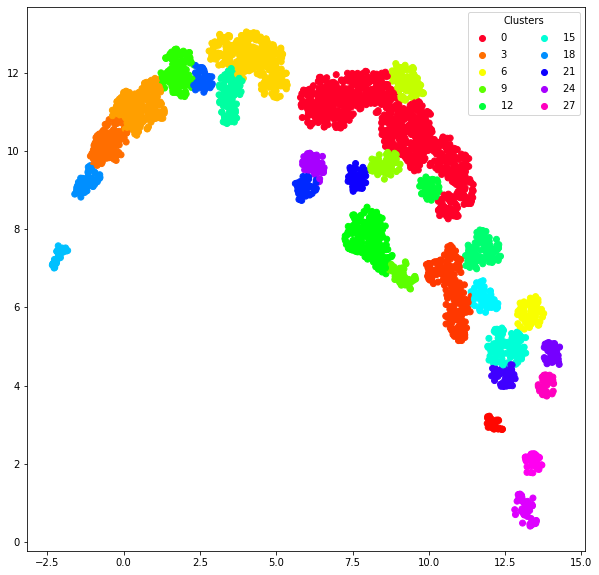

In [ ]:
mapper['DBScan'] = dbscan_m.labels_

#remove the noise cluster
mapper1 = mapper.loc[mapper['DBScan'] != -1]

plt.figure(figsize=(10, 10))
scatter = plt.scatter(mapper1['UMAP1'],mapper1['UMAP2'], c = mapper1['DBScan'], cmap ='gist_rainbow')
plt.legend(*scatter.legend_elements(), ncol=2, title='Clusters')

_ = plt.plot()

# Prepare a dataset with cluster information

**Create a new dataframe**

Create a new dataframe, which contains Cluster Groups from cluster types and coressponding genes expression among samples

In [ ]:
df_clust["DBScan"] = dbscan_m.labels_

df_DBScan = df_clust.astype(float)

df_DBScan.head()

,600MPE,AU565,BT474,BT483,BT549,CAMA1,EFM192A,EFM192B,EFM192C,HCC1143,...,MDAMB361,MDAMB453,MX1,SKBR3,SUM1315MO2,SUM149PT,SUM225CWN,SUM229PE,SUM52PE,DBScan
id,,,,,,,,,,,,,,,,,,,,,
ENSG00000000419,5.32,5.30,6.64,5.60,6.61,5.24,6.66,6.62,6.41,5.19,...,5.80,4.63,5.98,6.19,4.97,4.15,5.82,6.40,4.67,-1.0
ENSG00000001036,6.11,4.80,4.47,4.99,6.94,5.00,5.11,5.42,4.58,4.74,...,5.91,5.19,4.00,5.48,4.14,5.90,5.51,5.14,6.22,-1.0
ENSG00000001084,5.78,4.01,5.14,5.11,3.63,5.93,4.11,3.68,3.23,5.01,...,6.00,4.16,3.19,4.29,3.95,5.26,6.63,4.38,6.38,-1.0
ENSG00000001497,4.93,6.16,5.36,5.10,6.16,5.50,6.10,6.88,5.99,6.69,...,3.92,5.14,5.95,4.74,4.95,5.26,4.69,6.16,5.11,0.0
ENSG00000001617,4.06,7.53,4.70,6.69,3.30,5.39,6.55,6.41,5.26,1.76,...,5.49,7.74,1.38,6.81,1.71,4.80,3.80,5.59,5.27,0.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


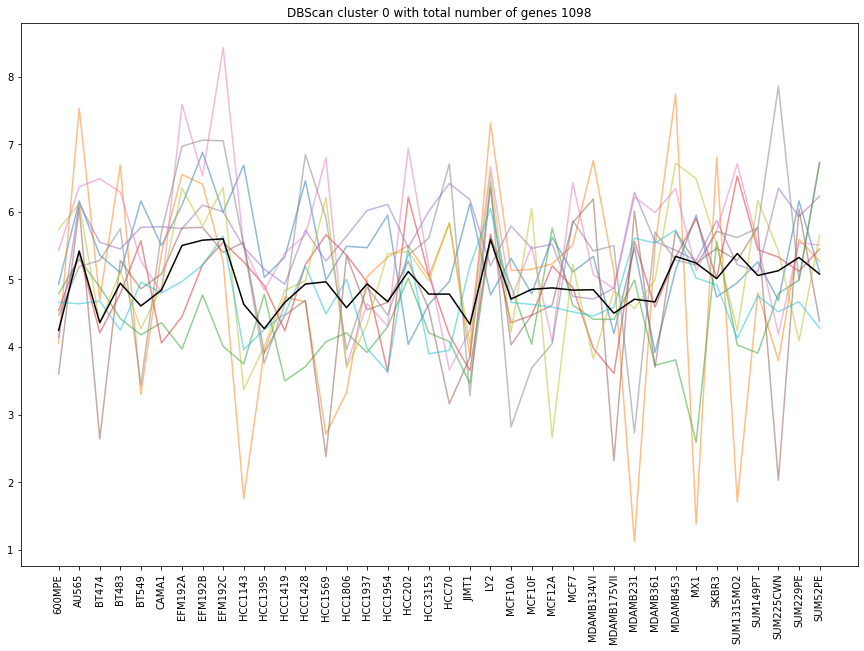

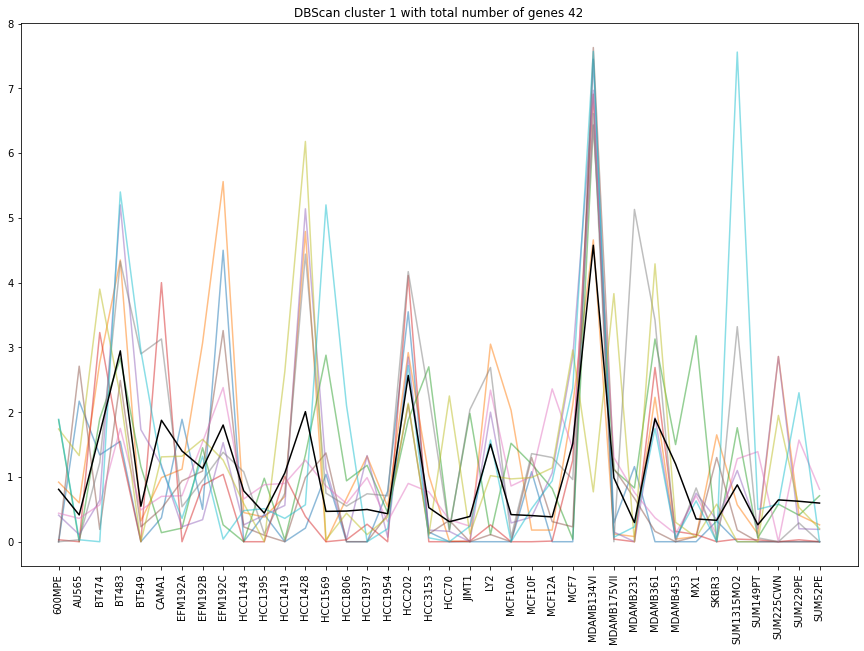

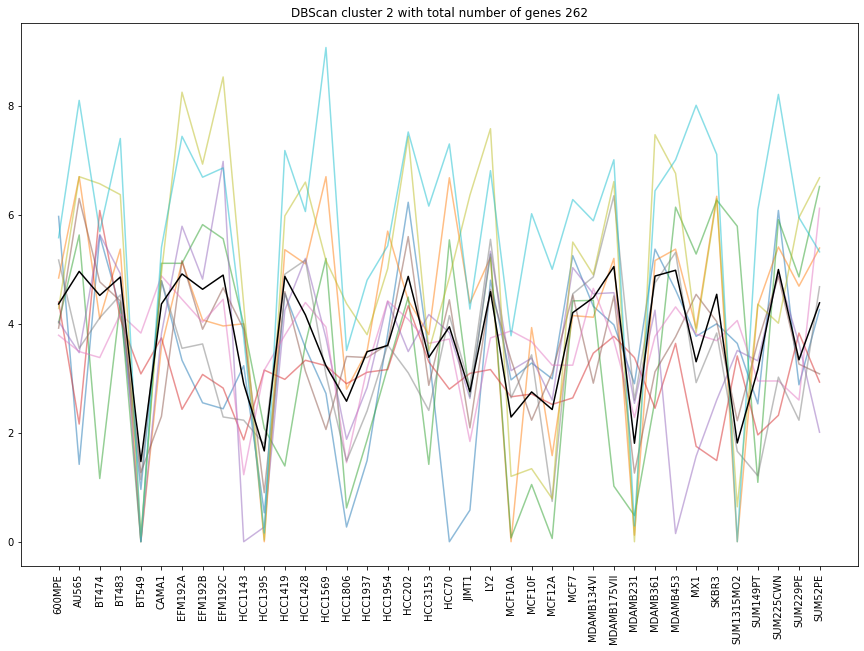

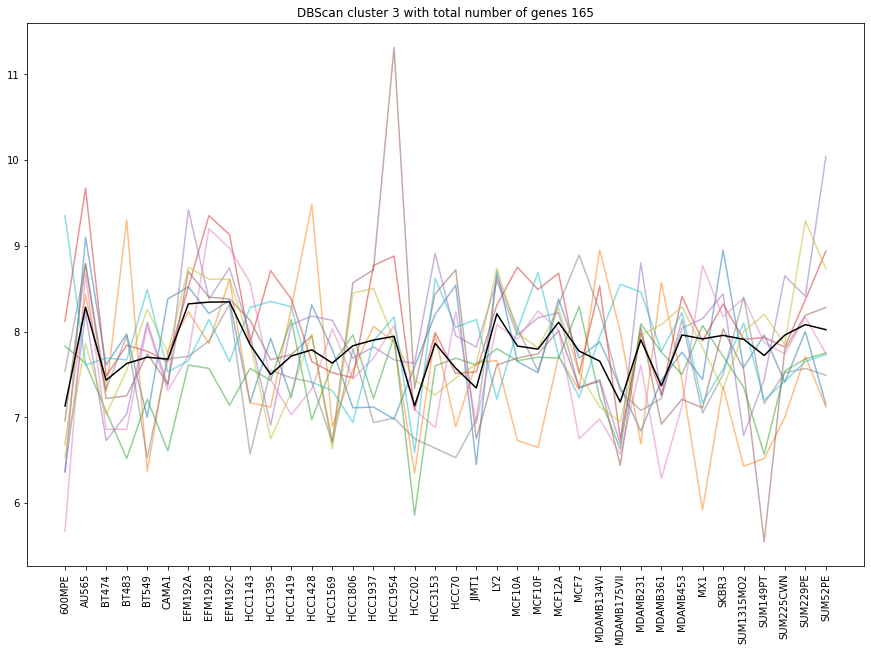

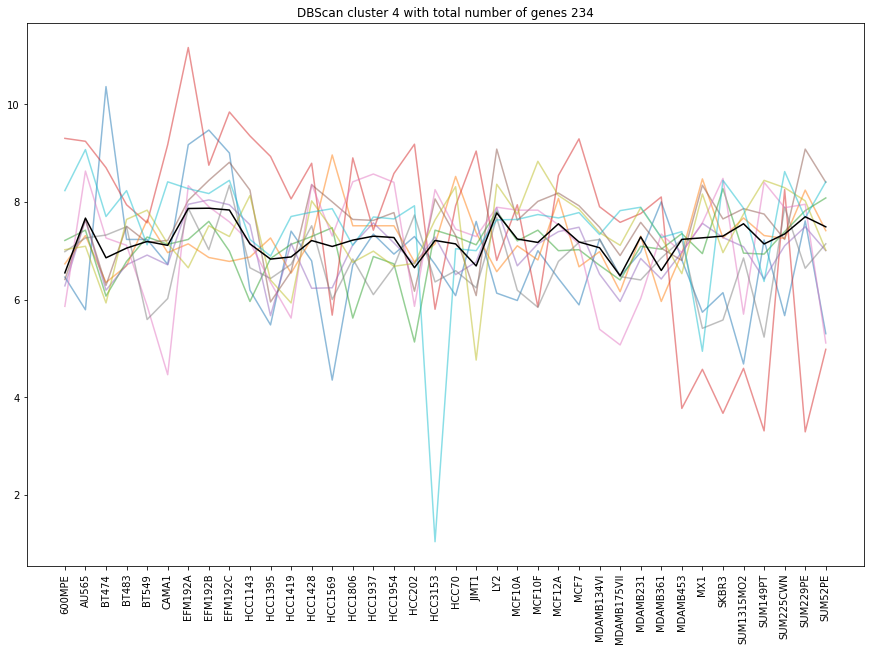

...

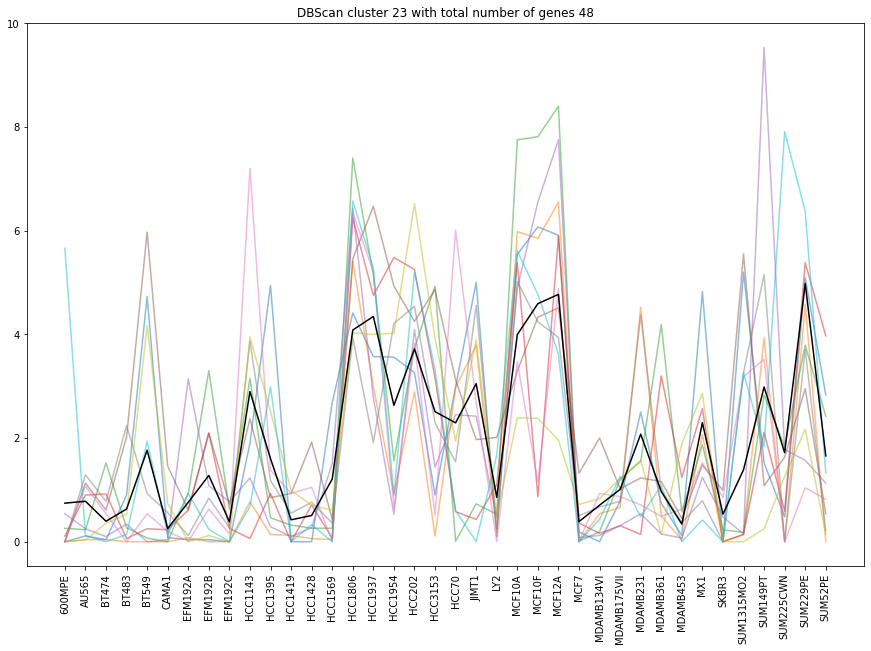

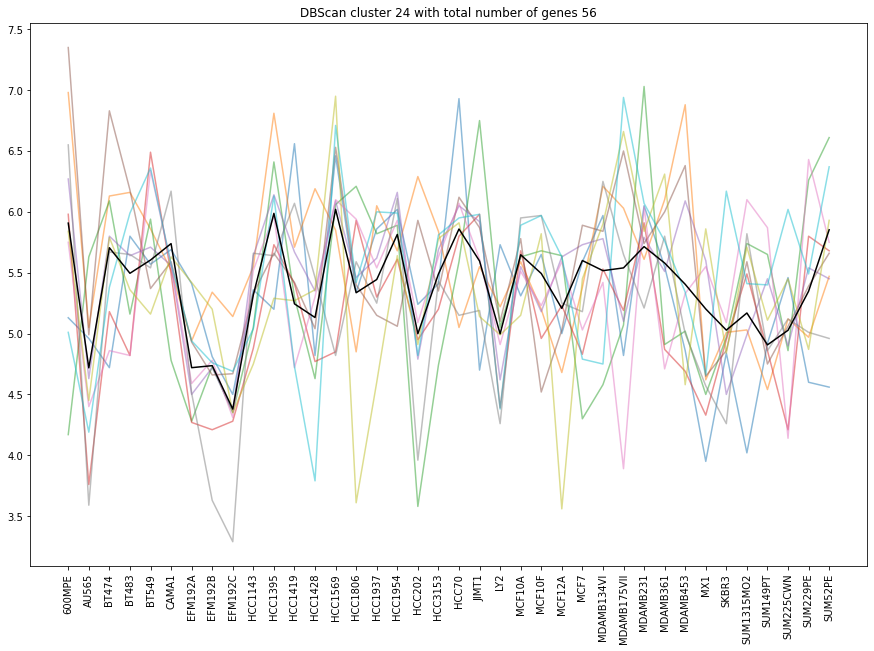

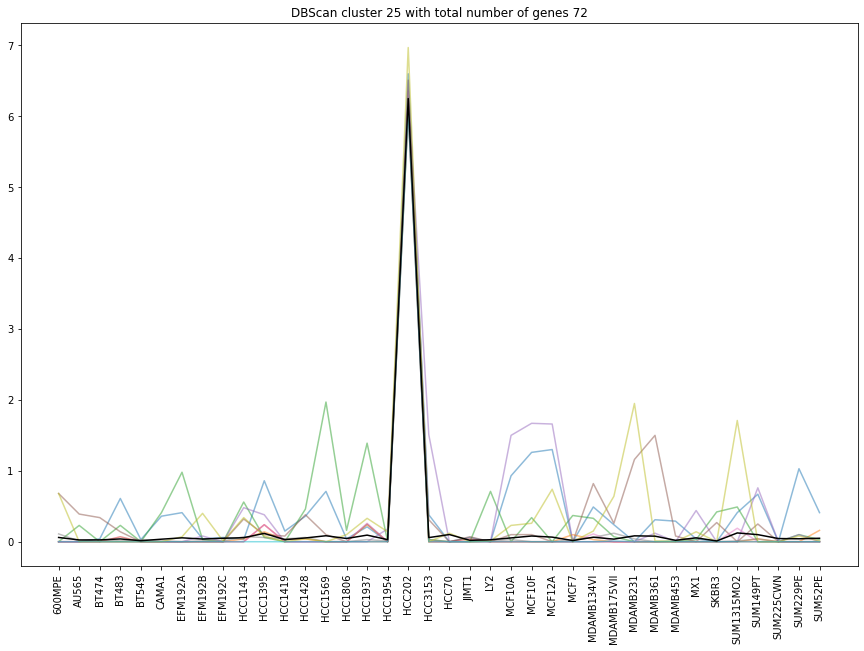

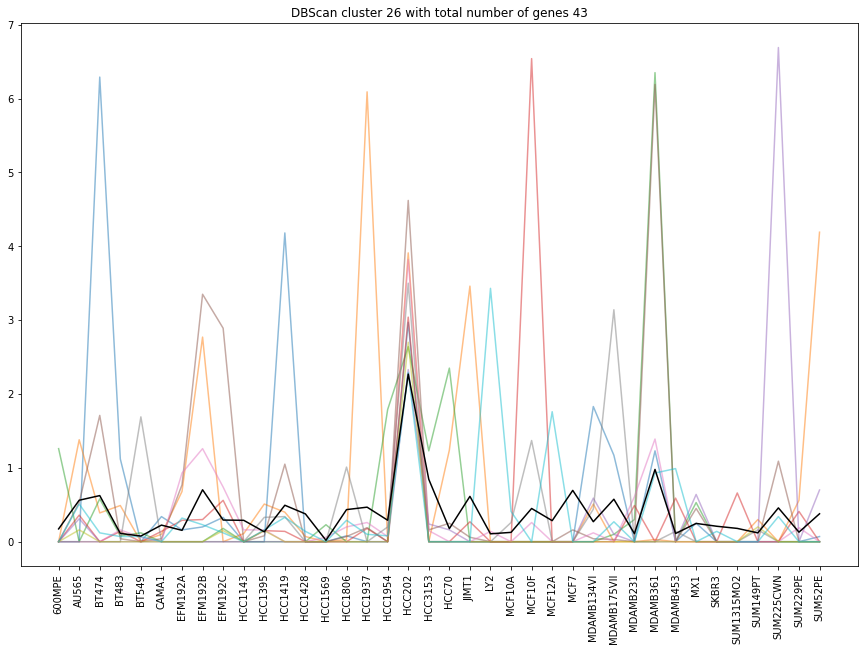

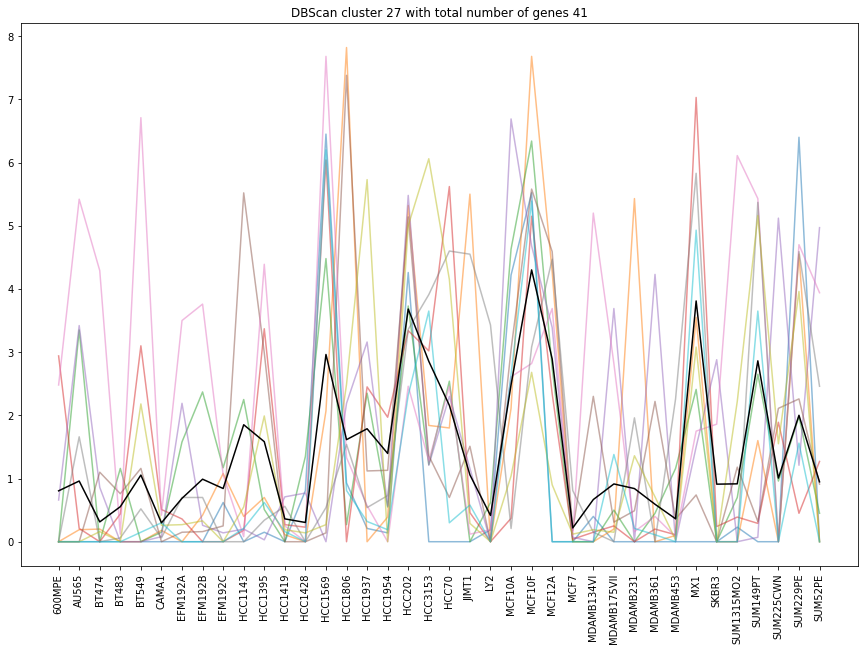

In [ ]:
# an empty list
corrlist_DB = []
n_clusters_DB = len(set(dbscan_m.labels_)) - (1 if -1 in dbscan_m.labels_ else 0)
averagelist = []
averageDF = pd.DataFrame()

#loop for DBScan clusters
for i in range(0, n_clusters_DB):
  #select only one cluster at a time
  clusteri = df_DBScan[df_DBScan['DBScan'] == i]
  clusteri = clusteri.drop(['DBScan'], axis=1)
  clusteri.head()
  n = len(clusteri)

  if n < 10:
    clusteriX = clusteri.head(5)
  else:
    clusteriX = clusteri.head(10)

  corr = clusteri.T.corr()
  average = clusteri.mean()
  corrmean = corr.values[np.triu_indices_from(corr.values,1)].mean()
  corrlist_DB.append([i, corrmean])
  averageDF[i] = average

  plt.figure(figsize=(15, 10))
  line = plt.plot(clusteriX.T, alpha=0.5)
  line1 = plt.plot(averageDF[i], c='black')
  plt.xticks(rotation=90)
  plt.title("DBScan cluster %s with total number of genes %s" % (i, n))

In [ ]:
corrlist_DB[1]

,600MPE,AU565,BT474,BT483,BT549,CAMA1,EFM192A,EFM192B,EFM192C,HCC1143,...,MDAMB361,MDAMB453,MX1,SKBR3,SUM1315MO2,SUM149PT,SUM225CWN,SUM229PE,SUM52PE,DBScan
id,,,,,,,,,,,,,,,,,,,,,
ENSG00000002330,4.20,6.69,5.81,5.39,5.94,4.88,6.91,5.81,6.64,5.77,...,5.53,6.30,6.81,7.38,6.37,6.56,7.00,5.73,6.74,1.0
ENSG00000004487,4.92,6.19,5.61,5.50,6.35,5.94,5.32,5.75,5.58,5.48,...,5.07,5.80,5.17,5.38,5.74,5.05,5.23,6.77,5.78,1.0
ENSG00000005007,4.97,6.17,5.12,5.29,5.25,5.17,6.07,6.61,6.53,5.62,...,4.90,5.70,5.73,5.65,5.97,6.08,5.50,5.95,5.59,1.0
ENSG00000006712,5.55,6.00,5.42,6.15,5.49,6.62,7.34,6.46,6.77,6.08,...,5.25,6.40,5.90,5.56,5.96,5.16,6.07,6.50,5.41,1.0
ENSG00000007520,3.71,5.92,3.91,5.70,5.36,5.55,6.31,7.08,6.89,5.28,...,5.17,5.93,5.95,5.90,6.43,6.47,6.56,6.24,5.65,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000254986,5.15,6.55,6.04,5.49,5.40,6.08,6.39,6.52,6.23,6.09,...,5.97,6.21,5.71,5.65,5.81,6.76,6.53,5.83,6.35,1.0
ENSG00000255302,5.73,5.36,5.91,5.51,6.49,5.98,6.10,5.89,5.82,5.81,...,6.60,6.85,5.29,4.94,6.12,5.87,5.10,6.10,5.60,1.0
ENSG00000258232,7.68,7.76,7.41,7.78,6.24,7.09,8.41,8.73,7.95,8.13,...,1.92,5.71,0.00,0.00,7.12,6.66,6.18,8.11,2.48,1.0


# Calculate Correlation

Text(0.5, 1.0, 'DBScan cluster Averages')

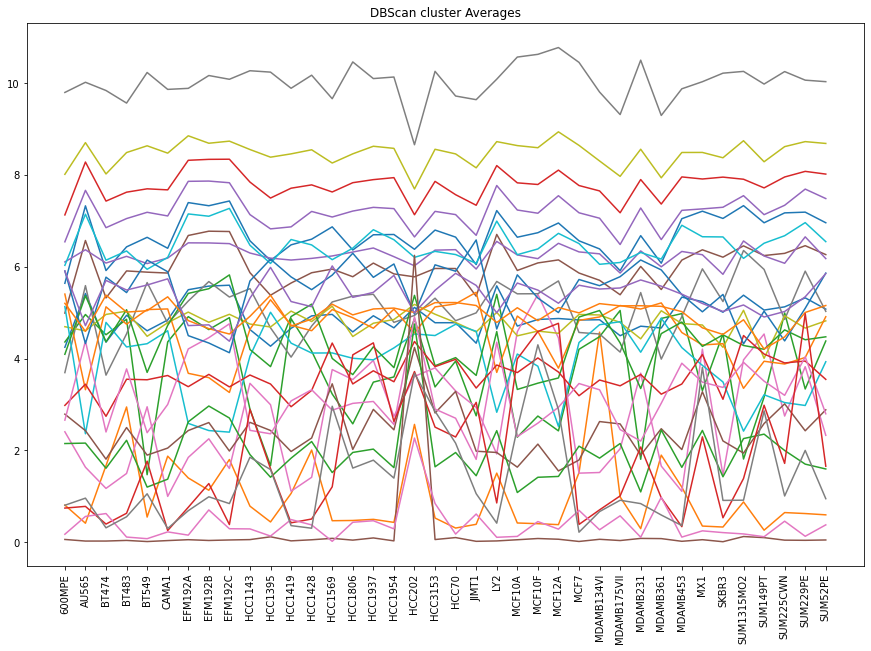

In [ ]:
plt.figure(figsize=(15, 10))
line = plt.plot(averageDF)
plt.xticks(rotation=90)
plt.title("DBScan cluster Averages")


In [ ]:
#DBscan correlation
DB_corr = pd.DataFrame(corrlist_DB, columns=["Cluster","Correlation"])

DB_corr
DB_corr.shape

(28, 2)

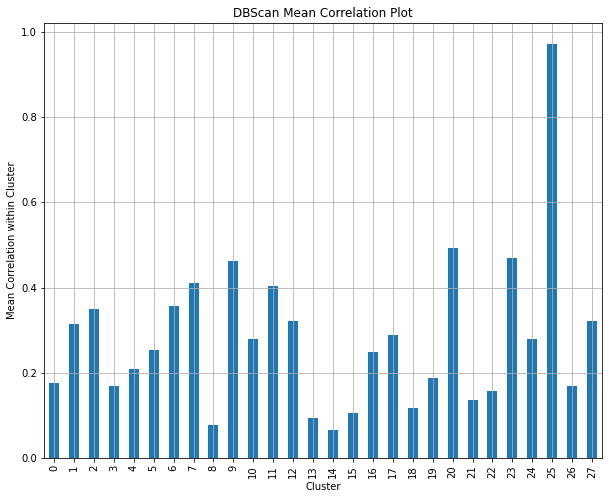

In [ ]:
DB_corr.plot.bar(
    x='Cluster', y='Correlation', 
    figsize=(10,8),
    title='DBScan Mean Correlation Plot', 
    legend=False,
    sharex=False, 
    grid=True).set(
        ylabel='Mean Correlation within Cluster')
    
_ = plt.plot()

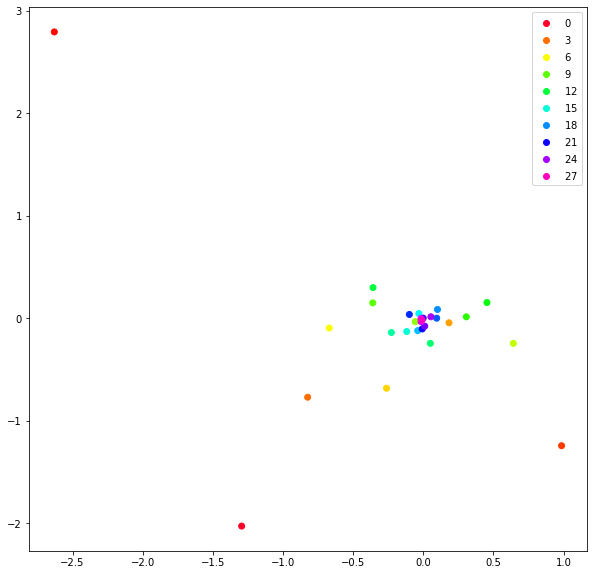

In [ ]:
pca_clust = PCA().fit_transform(averageDF)
pca_clust = pd.DataFrame(pca_clust)

pca_clust = pca_clust.T

pca_clust['clust'] = pca_clust.index

pca_clust.head()

plt.figure(figsize=(10, 10))
scatter = plt.scatter(pca_clust[0],pca_clust[1], c = pca_clust['clust'], cmap ='gist_rainbow')
plt.legend(*scatter.legend_elements())


In [ ]:
DBSCAN_Cluster11 = df_DBScan[df_DBScan['DBScan'] == 19]
DBSCAN_Cluster11 = DBSCAN_Cluster11.drop(['DBScan'], axis=1)

#write CSV
DBSCAN_Cluster11.to_csv('DBSCAN_Cluster11.csv')

# REMOVE HCC202

In [ ]:
#prepare new data
newData = datafinal.drop('HCC202', axis=1)

Number of DBSCAN clusters:  2


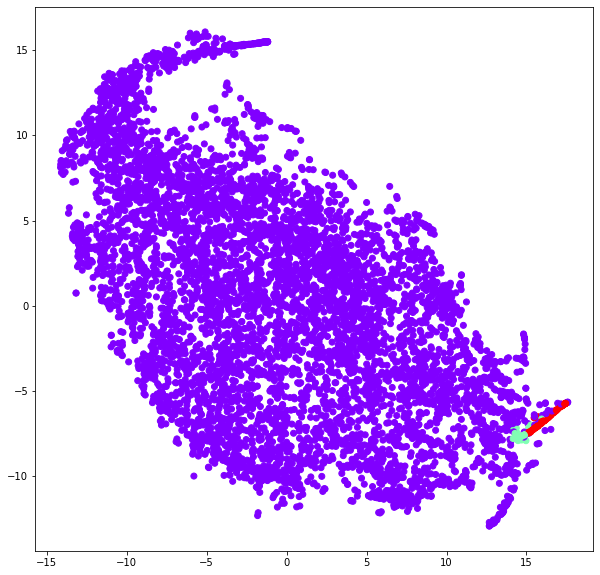

In [ ]:
#perform UMAP and DBSCAN

dbscan = DBSCAN(eps=0.7, min_samples=30).fit(data) # Changing eps and min_samples can alter estimated number of clusters
print('Number of DBSCAN clusters: ', len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0))

#scatterplot
plt.figure(figsize=(10, 10))
plt.scatter(df['TSNE1'], df['TSNE2'], c = dbscan.labels_, cmap = 'rainbow')
plt.show()


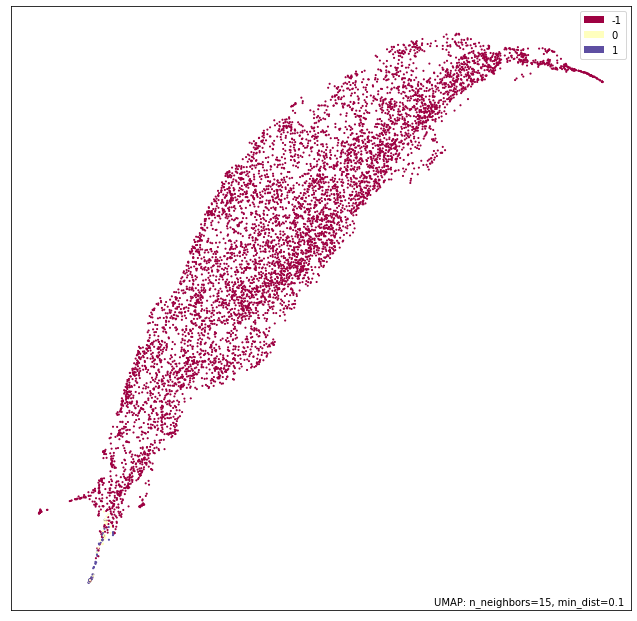

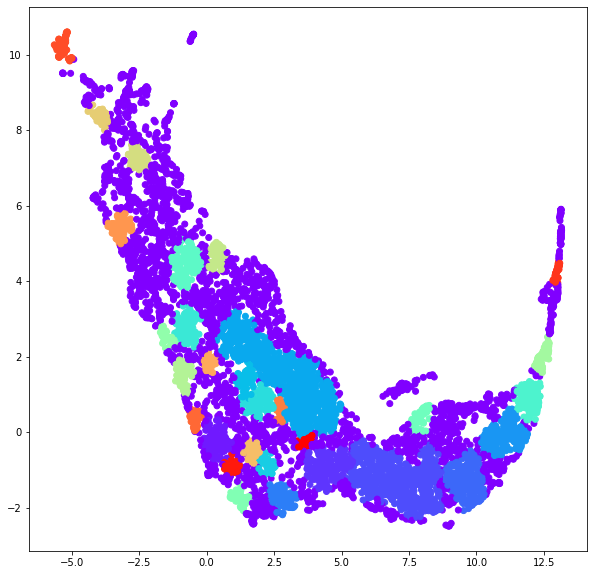

In [ ]:
mapper = pd.DataFrame(umap.UMAP(n_neighbors=5, min_dist=0.1).fit_transform(newData), columns = ['UMAP1','UMAP2'])
umap_mapper = umap.UMAP().fit(newData)
umap.plot.points(umap_mapper, labels=dbscan.labels_)

dbscan_m = DBSCAN(eps=0.3, min_samples=40).fit(mapper)

#scatter plot
plt.figure(figsize=(10, 10))

plt.scatter(mapper['UMAP1'], mapper['UMAP2'], c = dbscan_m.labels_, cmap = 'rainbow')
plt.show()

# Practice:
1. Prepare inbetween correlation calculations and plots for OPTICS vs KMEANS (or DBScan vs KMEANS)
2. compare clusters between themselves to see what each set of genes might be doing in terms of biological function (you can use https://david.ncifcrf.gov/summary.jsp)
3. Play around with OPTICS parameters (min_samples and epsilon to find better clustering)

# Reflection:

what is the best way to use technical scores (SSE or silhouette) and/or biological intepretation when using clustering for omics data?

<br>

Technical scores such as SSE and silhouette help provide an estimate for the number of clusters in the data. Biological interpretation does the same because if insights can be gained about the different functions of, in this case, genes, then one can estimate approximately how many clusters should be present. With this estimate, the validity of the clustering algorithms can more easily be evaluated by comparing the algorithm results to the predicted cluster value. This also allows for changing the parameters of the algorithms to find the ideal configuration for clustering which can then be confirmed with the technical scores.

---

<br>

To evaluate the marked cell lines data set, it was loaded in as a pandas data frame so that preprocessing could occurr. This preprocessing included storing the sample names, labels, and gene id values, and removing the unnecessary information from the data. From here, dimensionality reduction, specifically PCA, was performed to see the variance explained and to plot the data points in relation to these principal component values as well. The principal components selected explained 80% of the variance (75 and 5 percent respectively) which is at the threshold for a valid dimensionality reduction visualization. After this, TSNE was performed on the data to further evaluate the data in a reduced dimensionality space.

After visualizing the data in a reduced dimensionality space using both PCA and TSNE, density based spatial clustering with noise (DBSCAN) clustering was performed on the data using an epsilon value of 0.7 and a minimum sample value of 30 to evaluate the number of clusters this algorithm and these parameters would produce. The data was clustered using a K-means clustering algorithm with 3 clusters as a parameter to the function. The plot visualizations help compare how each clustering algorithm clusters the data. After performing these clusterings on the TSNE data, the data was visualized in a reduced dimensionality space using UMAP which was then again clustered using DBSCAN. In order to get an accurate representation of the DBSCAN clustering, the noise cluster (values with a cluster value of -1) was removed from the data and plotted, showing the clear density based clusters.

Using this cluster information, each cluster created in the DBSCAN algorithm was looped through and individually plotted showing the number of genes in each cluster and the genes average throughout the clusterings. Next the cluster correlation was evaluated and plotted on a bar plot comparing the number of clusters and the average correlation with the cluster. This data was then plotted with a PCA which showed a tight grouping of most clusters as well as apparent outliers in the number of clusters. The HCC202 gene was then dropped from the data which, according to depmap portal, is a gene associated with breast cancer and the data was re-evaluated. This updated data was clustered via DBSCAN and reduced using UMAP. The DBSCAN clusters were then plotted per the UMAP reduction to visualize the clustering in reduced space.